**Course**: Deep Learning Final Project- Object Detection with YOLO Using DIOR Dataset

[<img align="right" width="400" height="100" src="https://www.tu-braunschweig.de/typo3conf/ext/tu_braunschweig/Resources/Public/Images/Logos/tu_braunschweig_logo.svg">](https://www.tu-braunschweig.de/en/) 

[Abdulbaki Kocabasa]() \([a.kocabasa@tu-bs.de](@tu-bs.de)) and [Yao Yue]() (yue.yao@tu-bs.de)

[Technical University of Braunschweig](https://www.tu-braunschweig.de/en/)  




link for the drive content 

https://drive.google.com/drive/folders/1tvVlFz148YSfx2k1CAktpYIk2tGmOiu9?usp=sharing

## Check the GPU

In [ ]:
!nvidia-smi

Sun Sep 18 15:04:44 2022       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 460.32.03    Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla P100-PCIE...  Off  | 00000000:00:04.0 Off |                    0 |
| N/A   40C    P0    26W / 250W |      0MiB / 16280MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

# Import packages

In [ ]:
!pip install -U git+https://github.com/albu/albumentations
!pip uninstall opencv-python-headless -y

!pip install opencv-python-headless==4.1.2.30

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Cloning https://github.com/albu/albumentations to /tmp/pip-req-build-o24glzmb
  Running command git clone -q https://github.com/albu/albumentations /tmp/pip-req-build-o24glzmb
Found existing installation: opencv-python-headless 4.6.0.66
Uninstalling opencv-python-headless-4.6.0.66:
  Successfully uninstalled opencv-python-headless-4.6.0.66
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 21.8 MB 213 kB/s 


In [ ]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import Dense, Flatten, Conv2D, MaxPooling2D, Dropout, Input, BatchNormalization
from tensorflow.keras.layers import Conv2DTranspose, concatenate, UpSampling2D
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.utils import plot_model, to_categorical
from tensorflow.keras.metrics import OneHotMeanIoU, OneHotIoU
# Callbacks
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping
# Visualization
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import matplotlib.patches as patches
# Operation with arrays
import numpy as np
# Paths and files
from os.path import join,basename,splitext
import os
from glob import glob
from natsort import natsorted
# Reading images
import tifffile
from PIL import Image
# Others
import random
import cv2
import pandas as pd
import time
from tqdm import tqdm

#Install Dependencies. Only for first run

In [ ]:
# clone YOLOv5 repository
!git clone https://github.com/ultralytics/yolov5  # clone repo
%cd yolov5
#!git reset --hard fbe67e465375231474a2ad80a4389efc77ecff99

Cloning into 'yolov5'...
remote: Enumerating objects: 12449, done.
remote: Counting objects: 100% (156/156), done.
remote: Compressing objects: 100% (128/128), done.
remote: Total 12449 (delta 78), reused 65 (delta 28), pack-reused 12293
Receiving objects: 100% (12449/12449), 12.85 MiB | 23.09 MiB/s, done.
Resolving deltas: 100% (8545/8545), done.
/content/yolov5


In [ ]:
# install dependencies as necessary
!pip install -qr requirements.txt  # install dependencies (ignore errors)
import torch

from IPython.display import Image, clear_output  # to display images
from utils.downloads import attempt_download  # to download models/datasets

# clear_output()
print('Setup complete. Using torch %s %s' % (torch.__version__, torch.cuda.get_device_properties(0) if torch.cuda.is_available() else 'CPU'))

     |████████████████████████████████| 1.6 MB 7.6 MB/s 
Setup complete. Using torch 1.12.1+cu113 _CudaDeviceProperties(name='Tesla P100-PCIE-16GB', major=6, minor=0, total_memory=16280MB, multi_processor_count=56)


## Dataset

We will work with the DIOR Dataset [DIOR Dataset from Gong Cheng](https://gcheng-nwpu.github.io/).

Related paper is provided here [Paper](https://www.researchgate.net/publication/353126373_Feature_Enhancement_Network_for_Object_Detection_in_Optical_Remote_Sensing_Images).

DIOR and DIOR-R datasets

"DIOR" is a large-scale benchmark dataset for object detection in optical remote sensing images, which consists of 23,463 images and 192,518 object instances annotated with horizontal bounding boxes.

"DIOR-R" is an extended version of DIOR annotated with oriented bounding boxes, which shares the same images with DIOR.

<center>
<img width=500 src="https://www.researchgate.net/profile/Chunbo-Lang-2/publication/353126373/figure/fig1/AS:1048564859936769@1627008752474/Some-example-images-of-the-DIOR-dataset-3-used-in-our-experiments-where-the-numbers.png" img>
</center>

Labelled ground truth is provided for the related classes. An example of a patch from the dataset

<center>
<img width=600 src="https://www.researchgate.net/profile/Chunbo-Lang-2/publication/353126373/figure/fig4/AS:1048564859957249@1627008752777/Visualization-of-the-detection-results-The-detected-boxes-are-shown-with-different.jpg" img>
</center>


### Example from the Data and Classes

To create the train, validation and test sets, we will follow the benchmark guidelines:

<center>
<img width=600 src="https://www.researchgate.net/profile/Chunbo-Lang-2/publication/353126373/figure/tbl1/AS:1048564859953152@1627008752841/Object-classes-of-DIOR-and-DOTA-datasets-The-short-names-are-adopted-for-simplicity.png" img>
</center>

<center>
<img width=600 src="https://www.researchgate.net/publication/335599412/figure/fig2/AS:799249415548928@1567567318182/Example-images-taken-from-the-proposed-DIOR-dataset-which-were-obtained-with-different.png" img>
</center>


### Why DIOR?

Dior provides more variation of the class with high intraclass diversity and similarity which makes it superior to the other datasets available:
<center>
<img width=1000 src="https://www.researchgate.net/publication/335599412/figure/fig3/AS:799249415565312@1567567318331/Characteristics-of-our-proposed-DIOR-dataset.png" img>
</center>

# Internal Structure of the DIOR Dataset


## ├──images

	├──train#  This directory stores training data exp 001.jpg 002.jpg...
	├──val#  This directory stores validation data 
	├──test#  This directory stores test data 

## ├──labels

	├──train#  This directory stores the tags corresponding to the training data exp 001.txt 002.txt...
	├──val#  This directory stores the tags corresponding to the validation data 
	├──test#  This directory stores the labels corresponding to the test data 

## ├──path
	├──train.txt#  This text is the path where the training data is stored exp /images /train /001.jpg
	├──val.txt#  This directory is the path where the verification data is stored  
	├──test.txt#  The path where the test data is stored in this directory  


#check whether the dataset exist in the right directory

In [ ]:
!ls

benchmarks.py	 detect.py   models	       setup.cfg       val.py
classify	 export.py   README.md	       train.py
CONTRIBUTING.md  hubconf.py  requirements.txt  tutorial.ipynb
data		 LICENSE     segment	       utils


In [ ]:
%cd ..

/content


In [ ]:
!mkdir datasets
%cd datasets

/content/datasets


In [ ]:
!pwd

/content/datasets


In [ ]:
!mkdir DIOR
%cd DIOR

/content/datasets/DIOR


In [ ]:
#1HEXzAhN4bbqnmJnOlUYD3nPGfl2OkHSn this is for default DIOR
#1p4tPos0osMCF2iVSEXqacCAfvPE-xFyM this is for smaller DIOR
#!gdown 1HEXzAhN4bbqnmJnOlUYD3nPGfl2OkHSn #uses google drive to download the dataset
!wget -O DIOR2.rar https://www.dropbox.com/s/lwogcs4zxca8zg3/DIOR2.rar?dl=0 # google drive causes some problem, so this is a dropbox link.


--2022-09-18 15:05:19--  https://www.dropbox.com/s/lwogcs4zxca8zg3/DIOR2.rar?dl=0
Resolving www.dropbox.com (www.dropbox.com)... 162.125.1.18, 2620:100:6035:18::a27d:5512
Connecting to www.dropbox.com (www.dropbox.com)|162.125.1.18|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: /s/raw/lwogcs4zxca8zg3/DIOR2.rar [following]
--2022-09-18 15:05:20--  https://www.dropbox.com/s/raw/lwogcs4zxca8zg3/DIOR2.rar
Reusing existing connection to www.dropbox.com:443.
HTTP request sent, awaiting response... 302 Found
Location: https://uc04acbd5d4ed306f8b2e1908d8f.dl.dropboxusercontent.com/cd/0/inline/BtJXEERSjqBowVafQ5SIjI5Neo93z0Vjm-niq4SWkUOnIhdDQtqBhlBO1BMtTXZU_QeEtWU977hpkvNsDwMFHxwf3c6EjuP0VvDh6AjY_HQaHZsVIjldDxnG1rP6QuKYym-TqjMO1q1TGYpGKbdiuQdxeOd5ytChcBicTRnHwpP2FQ/file# [following]
--2022-09-18 15:05:20--  https://uc04acbd5d4ed306f8b2e1908d8f.dl.dropboxusercontent.com/cd/0/inline/BtJXEERSjqBowVafQ5SIjI5Neo93z0Vjm-niq4SWkUOnIhdDQtqBhlBO1BMtTXZU_QeEtWU977hpkvNsDwM

In [ ]:
!unrar x "DIOR2.rar" #unrar the dataset into the google colabs. This way is faster than using google drive directly.

Streaming output truncated to the last 5000 lines.
Extracting  train/labels/17296.txt                                        99%  OK 
Extracting  train/labels/17297.txt                                        99%  OK 
Extracting  train/labels/17299.txt                                        99%  OK 
Extracting  train/labels/17300.txt                                        99%  OK 
Extracting  train/labels/17301.txt                                        99%  OK 
Extracting  train/labels/17302.txt                                        99%  OK 
Extracting  train/labels/17303.txt                                        99%  OK 
Extracting  train/labels/17304.txt                                        99%  OK 
Extracting  train/labels/17305.txt                                        99%  OK 
Extracting  train/labels/17307.txt                                        99%  OK 
Extracting  train/labels/1730

In [ ]:
!pwd

/content/datasets/DIOR


In [ ]:
!rm DIOR2.rar

In [ ]:
PROJECT_FOLDER = '.'#Do not change it
print(f"PROJECT_FOLDER: {os.getcwd()}")

PROJECT_FOLDER: /content/datasets/DIOR


In [ ]:
BOXES_PATH =os.path.join(PROJECT_FOLDER,"*/labels")

annotations_file = glob(BOXES_PATH+'/*.txt') 
annotations_file = natsorted(annotations_file, key=lambda y: y.lower())
annotations = []
for anno in tqdm(annotations_file):
  tmp = pd.read_csv(anno, sep=" ", header=None)
  tmp.columns = ['class','x_center','y_center','w','h']
  bbox_cols = ['x_center','y_center','w','h']
  tmp['BBox']=[x for x in tmp[bbox_cols].to_numpy().astype(float)]
  tmp = tmp.drop(bbox_cols, axis=1)
  annotations.append(tmp)



100%|██████████| 23463/23463 [01:26<00:00, 272.59it/s]


In [ ]:
IMAGES_PATH = os.path.join(PROJECT_FOLDER,"*/images")
images_files = glob(IMAGES_PATH+'/*.jpg')
images_files = natsorted(images_files, key=lambda y: y.lower())

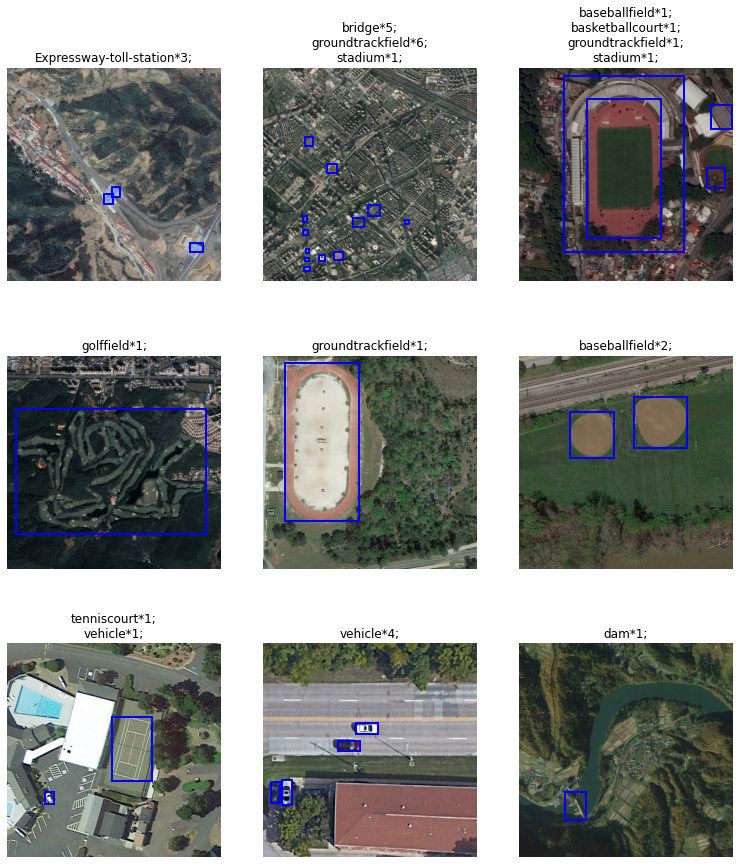

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches
class_name_to_id_mapping = {'airplane':0,
                'airport':1, 
                'baseballfield':2, 
                'basketballcourt':3, 
                'bridge':4,
                'chimney':5,
                'dam':6,
                'Expressway-Service-area':7,
                'Expressway-toll-station':8,
                'harbor':9,
                'golffield':10,
                'groundtrackfield':11,
                'overpass':12,
                'ship':13,
                'stadium':14,
                'storagetank':15,
                'tenniscourt':16,
                'trainstation':17,
                'vehicle':18,
                'windmill':19}

plt.figure(figsize=(13, 15))
rng = np.random.default_rng()
num_image_for_plot = 9
# label = class_name
selected_images = rng.integers(len(images_files), size=num_image_for_plot)
for i,idx in enumerate(selected_images):
  ax = plt.subplot(3, 3, i + 1)
  image_path = images_files[idx]
  x_sample = tf.keras.utils.load_img(image_path)
  x_sample = tf.keras.utils.img_to_array(x_sample).astype("uint8")
  ax.imshow(x_sample)

  
  # ax.set_title(label)
  for j in range(np.shape(annotations[idx]['BBox'])[0]):
    x_center, y_center, w, h=annotations[idx]['BBox'][j]
    height,width = x_sample.shape[:2] 
    startX = (2*x_center*width-w*width)/2
    startY = (2*y_center*height-h*height)/2
    endX = startX + w*width
    endY = startY + h*height
    rect = patches.Rectangle((startX, startY), endX-startX, endY-startY, linewidth=2, edgecolor='b', facecolor='none')
    ax.add_patch(rect)
    classes, counts = np.unique(annotations[idx]['class'], return_counts=True)
    title = ''
    for cl,co in zip(classes,counts):
      class_name = list(class_name_to_id_mapping.keys())[list(class_name_to_id_mapping.values()).index(cl)]
      title = title + str(class_name) + "*" + str(co) +';\n' 
    ax.set_title(title.strip())

  ax.axis('off')
    
plt.show()

### statistics

In [ ]:
#class_name:[total number, how many samples have this class]
statistics_class = {'airplane':[0,0],
          'airport':[0,0], 
          'baseballfield':[0,0], 
          'basketballcourt':[0,0], 
          'bridge':[0,0],
          'chimney':[0,0],
          'dam':[0,0],
          'Expressway-Service-area':[0,0],
          'Expressway-toll-station':[0,0],
          'harbor':[0,0],
          'golffield':[0,0],
          'groundtrackfield':[0,0],
          'overpass':[0,0],
          'ship':[0,0],
          'stadium':[0,0],
          'storagetank':[0,0],
          'tenniscourt':[0,0],
          'trainstation':[0,0],
          'vehicle':[0,0],
          'windmill':[0,0]}
for anno in tqdm(annotations):
  classes, counts = np.unique(anno["class"], return_counts=True)
  for cl,co in zip(classes,counts):
    class_name = list(class_name_to_id_mapping.keys())[list(class_name_to_id_mapping.values()).index(cl)]
    statistics_class[class_name][0] += co
    statistics_class[class_name][1] += 1



100%|██████████| 23463/23463 [00:05<00:00, 4251.54it/s]


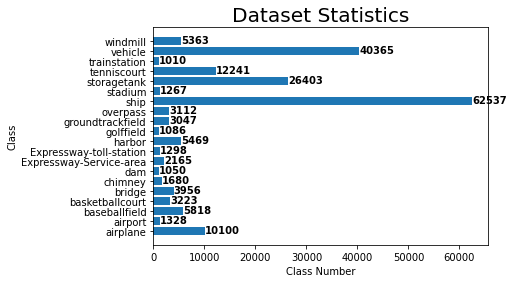

In [ ]:
fig, ax = plt.subplots()

plt.style.use('fivethirtyeight')
ax.barh(list(statistics_class.keys()), np.array(list(statistics_class.values()))[:,0])
ax = plt.gca()
for tick in ax.yaxis.get_major_ticks():
    tick.label.set_fontsize(10)
ax.set(xlabel='Class Number', ylabel='Class',title='Dataset Statistics')
for i, v in enumerate(np.array(list(statistics_class.values()))[:,0]):
    ax.text(v+5 , i-0.2 , str(v), color='black', fontweight='bold',size=10)

plt.show()


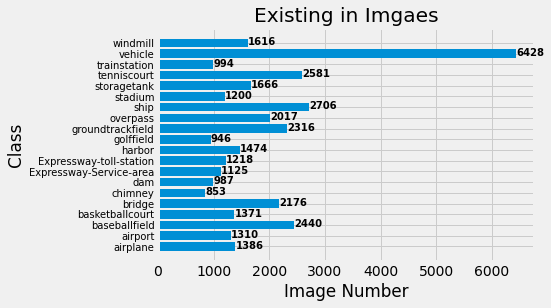

In [ ]:
fig, ax = plt.subplots()

plt.style.use('fivethirtyeight')
ax.barh(list(statistics_class.keys()), np.array(list(statistics_class.values()))[:,1])
ax = plt.gca()
for tick in ax.yaxis.get_major_ticks():
    tick.label.set_fontsize(10)
ax.set(xlabel='Image Number', ylabel='Class',title='Existing in Imgaes')
for i, v in enumerate(np.array(list(statistics_class.values()))[:,1]):
    ax.text(v+5 , i-0.2 , str(v), color='black', fontweight='bold',size=10)

plt.show()

In [ ]:
%cd ..

/content/datasets


In [ ]:
%cd ..

/content


In [ ]:
%cd yolov5

/content/yolov5


#Setup the YAML files for training
To train a YOLO-V5 model, we need to have two YAML files.

The first YAML to specify:

where our training and validation data is
the number of classes that we want to detect
and the names corresponding to those classes
This YAML of ours looks like this:

train: ./train/images 

val: ./valid/images  

nc: 7 

names: ['fish', 'jellyfish', 'penguin', 'puffin', 'shark', 'starfish', 'stingray']

The second YAML is to specify the whole model configuration. You can change the network architecture in this step if you want but we will go with the default one.

The YAML which we term custom_yolov5s.yaml:



# How to Run

There are multiple hyperparameters that we can specify which are:

img: define input image size

batch: determine batch size

epochs: define the number of training epochs.

data: set the path to our YAML file

cfg: specify our model configuration

weights: specify a custom path to weights

name: result names

nosave: only save the final checkpoint

cache: cache images for faster training

--cache is used to have more gains from Ram in Colabs. Otherwise, process takes more time to be done.

place the dataset.yaml from drive into /yolov5/data

In [ ]:
%cd data
!gdown --id 1kNiXN4e8tt-1HRx9lAdAMrEGYZoGHk6-


/content/yolov5/data
/usr/local/lib/python3.7/dist-packages/gdown/cli.py:131: FutureWarning: Option `--id` was deprecated in version 4.3.1 and will be removed in 5.0. You don't need to pass it anymore to use a file ID.
  category=FutureWarning,
Downloading...
From: https://drive.google.com/uc?id=1kNiXN4e8tt-1HRx9lAdAMrEGYZoGHk6-
To: /content/yolov5/data/dataset.yaml
100% 482/482 [00:00<00:00, 814kB/s]


In [ ]:
%cd ..

/content/yolov5


# Resume Training(Just in case there is already started one)

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!pwd

/content/yolov5


In [ ]:
!mkdir small
!mkdir medium

In [ ]:
%cd small

/content/yolov5/small


In [ ]:
%cp /content/drive/My\ Drive/small/best.pt /content/yolov5/small/

In [ ]:
%cp /content/drive/My\ Drive/small/last.pt /content/yolov5/small/

In [ ]:
%cd ..
%cd medium

/content/yolov5
/content/yolov5/medium


In [ ]:
%cp /content/drive/My\ Drive/medium/best.pt /content/yolov5/medium/

In [ ]:
%cp /content/drive/My\ Drive/medium/last.pt /content/yolov5/medium/

In [ ]:
%cd ..

/content/yolov5


# Resume Training(Just in case there is previous one)

In [ ]:
!python train.py --img 800 --batch 64 --epochs 50 --data ./data/dataset.yaml --cache disk --resume ./last.pt

train: weights=yolov5s.pt, cfg=, data=./data/dataset.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=50, batch_size=64, imgsz=800, rect=False, resume=./last.pt, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=disk, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=exp, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v6.2-123-g5e1a955 Python-3.7.14 torch-1.12.1+cu113 CUDA:0 (Tesla P100-PCIE-16GB, 16281MiB)

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.125, cls_pw=1.0, obj=1.5625, obj_pw=1.0, iou_t=0.2, anchor_t=4.0, fl_gamma=0.0, hsv_h=

once we have weights imported, we do not need to use --cfg.

!python train.py --img 800 --batch 100 --epochs 10 --data ./data/dataset.yaml --weights yolov5s.pt --freeze 10 --name yolov5s_results

# Start Training(Just in case there is no previous one)

In [ ]:
#working run
#!python train.py --img 800 --batch 100 --epochs 10 --data ./data/dataset.yaml --cfg ./models/yolov5s.yaml --weights yolov5s.pt --freeze 10 --name yolov5s_results
#freeze is used to freeze first 10 layers. That prevents over fitting. There is a comparison about full freezing and partial freezing in this link below.
#https://github.com/ultralytics/yolov5/issues/1314
!python train.py --img 800 --batch 64 --epochs 50 --data ./data/dataset.yaml --weights yolov5m.pt --freeze 10 --name yolov5s_results --cache disk


train: weights=yolov5m.pt, cfg=, data=./data/dataset.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=50, batch_size=64, imgsz=800, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=disk, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=yolov5s_results, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[10], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v6.2-125-g6a9fffd Python-3.7.14 torch-1.12.1+cu113 CUDA:0 (Tesla P100-PCIE-16GB, 16281MiB)

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, obj=1.0, obj_pw=1.0, iou_t=0.2, anchor_t=4.0, fl_gamma=0.0, hs

In [ ]:
# Play an audio beep. Any audio URL will do.
from google.colab import output
output.eval_js('new Audio("https://upload.wikimedia.org/wikipedia/commons/0/05/Beep-09.ogg").play()')

# Export Trained Weights for Future Inference

Now that you have trained your custom detector, you can export the trained weights you have made here for inference on your device elsewhere

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
%cp /content/yolov5/runs/train/yolov5s_results2/weights/best.pt /content/drive/My\ Drive

In [ ]:
%cp /content/yolov5/runs/train/yolov5s_results2/weights/last.pt /content/drive/My\ Drive

In [ ]:
%cp /content/yolov5/runs/train/yolov5s_results2/results.png /content/drive/My\ Drive

# Evaluate Custom YOLOv5 Detector Performance

Training losses and performance metrics are saved to Tensorboard and also to a logfile defined above with the **--name** (yolov5s_results) flag when we train. In our case, we named this `yolov5s_results`. (If given no name, it defaults to `results.txt`.) The results file is plotted as a png after training completes.

Note from author: Partially completed `results.txt` files can be plotted with `from utils.utils import plot_results; plot_results()`.

In [ ]:
# Start tensorboard
# Launch after you have started training
# logs save in the folder "runs"
%load_ext tensorboard
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

In [ ]:
%reload_ext tensorboard

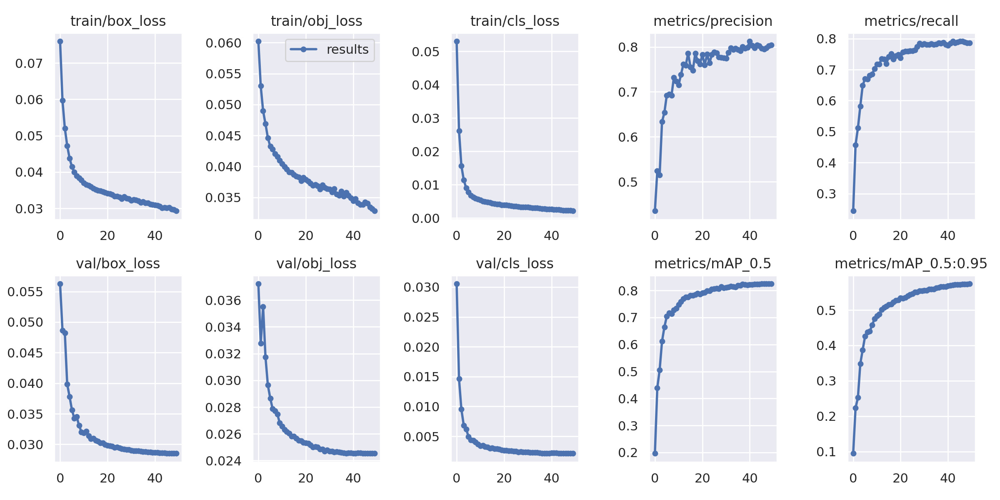

In [ ]:
# we can also output some older school graphs if the tensor board isn't working for whatever reason... 
from utils.plots import plot_results  # plot results.txt as results.png
Image(filename='/content/yolov5/runs/train/yolov5s_results2/results.png', width=1000)  # view results.png

### Visualize Our Training Data with Labels

After training starts, view `train*.jpg` images to see training images, labels and augmentation effects.

GROUND TRUTH OF TRAINING DATA:


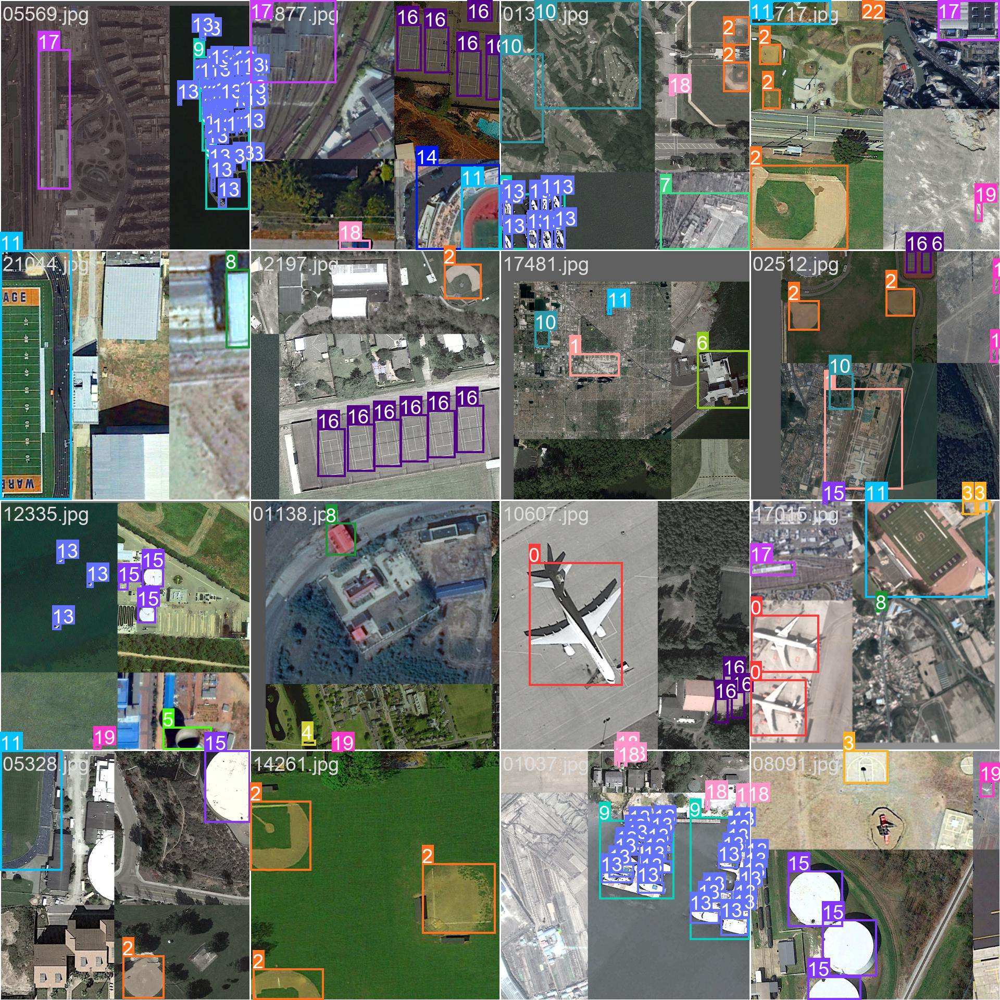

In [ ]:
print("GROUND TRUTH OF TRAINING DATA:")
Image(filename='/content/yolov5/runs/train/yolov5s_results2/train_batch0.jpg', width=1000)

GROUND TRUTH OF VALIDATION DATA:


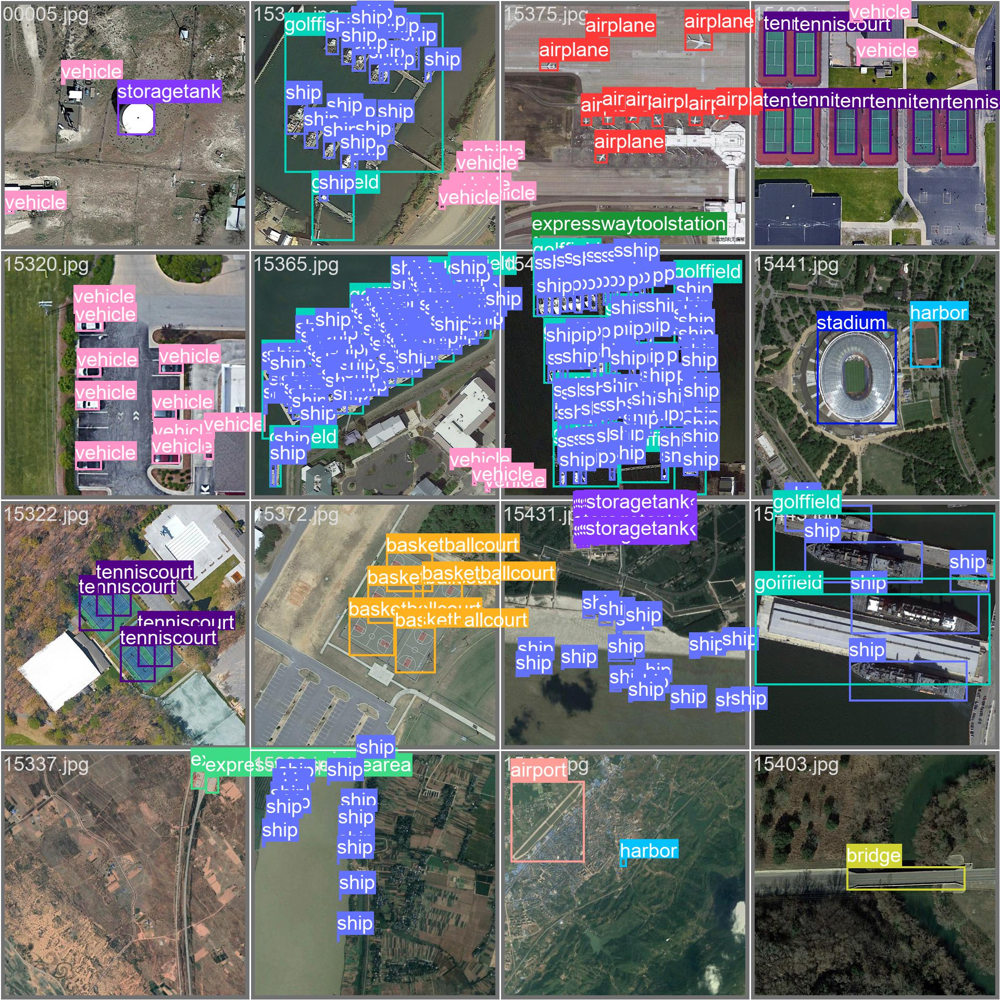

In [ ]:
# first, display our ground truth data
print("GROUND TRUTH OF VALIDATION DATA:")
Image(filename='/content/yolov5/runs/train/yolov5s_results2/val_batch0_labels.jpg', width=1000)

#Run Inference  With Trained Weights
Run inference with a pretrained checkpoint on contents of `test/images` folder


In [ ]:
# trained weights are saved by default in our weights folder
%ls runs/

train/


In [ ]:
%ls runs/train/yolov5s_results2/weights

best.pt  last.pt


In [ ]:
!pwd

/content/yolov5


# Start Detection Process With The Weights of Small Model

In [ ]:
!python detect.py --weights small/best.pt --img 800 --conf 0.3 --source ../datasets/DIOR/test/images --save-txt

detect: weights=['small/best.pt'], source=../datasets/DIOR/test/images, data=data/coco128.yaml, imgsz=[800, 800], conf_thres=0.3, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=True, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v6.2-134-gca9c993 Python-3.7.14 torch-1.12.1+cu113 CUDA:0 (Tesla P100-PCIE-16GB, 16281MiB)

Fusing layers... 
Model summary: 157 layers, 7064065 parameters, 0 gradients, 15.9 GFLOPs
image 1/2347 /content/datasets/DIOR/test/images/00001.jpg: 800x800 1 airplane, 11.3ms
image 2/2347 /content/datasets/DIOR/test/images/00003.jpg: 800x800 1 trainstation, 15 vehicles, 11.7ms
image 3/2347 /content/datasets/DIOR/test/images/00007.jpg: 800x800 5 boldfields, 151 ships, 11.5ms
image 4/2347 /content/datasets/DIOR/test/images/00008.jp

# Start Detection Process With The Weights of Medium Model

In [ ]:
!python detect.py --weights medium/best.pt --img 800 --conf 0.3 --source ../datasets/DIOR/test/images --save-txt

detect: weights=['medium/best.pt'], source=../datasets/DIOR/test/images, data=data/coco128.yaml, imgsz=[800, 800], conf_thres=0.3, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=True, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v6.2-134-gca9c993 Python-3.7.14 torch-1.12.1+cu113 CUDA:0 (Tesla P100-PCIE-16GB, 16281MiB)

Fusing layers... 
Model summary: 212 layers, 20929713 parameters, 0 gradients, 48.1 GFLOPs
image 1/2347 /content/datasets/DIOR/test/images/00001.jpg: 800x800 1 groundtrackfield, 17.7ms
image 2/2347 /content/datasets/DIOR/test/images/00003.jpg: 800x800 2 trainstations, 12 vehicles, 17.9ms
image 3/2347 /content/datasets/DIOR/test/images/00007.jpg: 800x800 4 golffields, 150 ships, 1 vehicle, 17.7ms
image 4/2347 /content/datasets/DIO

# Start Validation Process With The Weights of Small Model

In [ ]:
# when we ran this, we saw .007 second inference time. That is 140 FPS on a TESLA P100!
# use the best weights!
!python val.py --batch-size 64 --data ./data/dataset.yaml --weights small/best.pt --img 800 --conf 0.3   --save-txt

val: data=./data/dataset.yaml, weights=['small/best.pt'], batch_size=64, imgsz=800, conf_thres=0.3, iou_thres=0.6, max_det=300, task=val, device=, workers=8, single_cls=False, augment=False, verbose=False, save_txt=True, save_hybrid=False, save_conf=False, save_json=False, project=runs/val, name=exp, exist_ok=False, half=False, dnn=False
WARNING ⚠️ confidence threshold 0.3 > 0.001 produces invalid results
YOLOv5 🚀 v6.2-134-gca9c993 Python-3.7.14 torch-1.12.1+cu113 CUDA:0 (Tesla P100-PCIE-16GB, 16281MiB)

Fusing layers... 
Model summary: 157 layers, 7064065 parameters, 0 gradients, 15.9 GFLOPs
val: Scanning '/content/datasets/DIOR/valid/labels.cache' images and labels... 2346 found, 0 missing, 0 empty, 0 corrupt: 100% 2346/2346 [00:00<?, ?it/s]
                 Class     Images  Instances          P          R      mAP50   mAP50-95: 100% 37/37 [00:45<00:00,  1.24s/it]
                   all       2346      18702       0.75      0.674      0.737      0.514
              airplane       23

# Start Detection Process With The Weights of Medium Model

In [ ]:
#@title Default title text
# when we ran this, we saw .007 second inference time. That is 140 FPS on a TESLA P100!
# use the best weights!
!python val.py --batch-size 64 --data ./data/dataset.yaml --weights medium/best.pt --img 800 --conf 0.3   --save-txt

val: data=./data/dataset.yaml, weights=['medium/best.pt'], batch_size=64, imgsz=800, conf_thres=0.3, iou_thres=0.6, max_det=300, task=val, device=, workers=8, single_cls=False, augment=False, verbose=False, save_txt=True, save_hybrid=False, save_conf=False, save_json=False, project=runs/val, name=exp, exist_ok=False, half=False, dnn=False
WARNING ⚠️ confidence threshold 0.3 > 0.001 produces invalid results
YOLOv5 🚀 v6.2-134-gca9c993 Python-3.7.14 torch-1.12.1+cu113 CUDA:0 (Tesla P100-PCIE-16GB, 16281MiB)

Fusing layers... 
Model summary: 212 layers, 20929713 parameters, 0 gradients, 48.1 GFLOPs
100% 755k/755k [00:00<00:00, 25.1MB/s]
val: Scanning '/content/datasets/DIOR/valid/labels' images and labels...2346 found, 0 missing, 0 empty, 0 corrupt: 100% 2346/2346 [00:05<00:00, 457.00it/s] 
val: New cache created: /content/datasets/DIOR/valid/labels.cache
                 Class     Images  Instances          P          R      mAP50   mAP50-95: 100% 37/37 [01:02<00:00,  1.69s/it]
          

## Compare the Detected Boxes With Their Ground Truth 

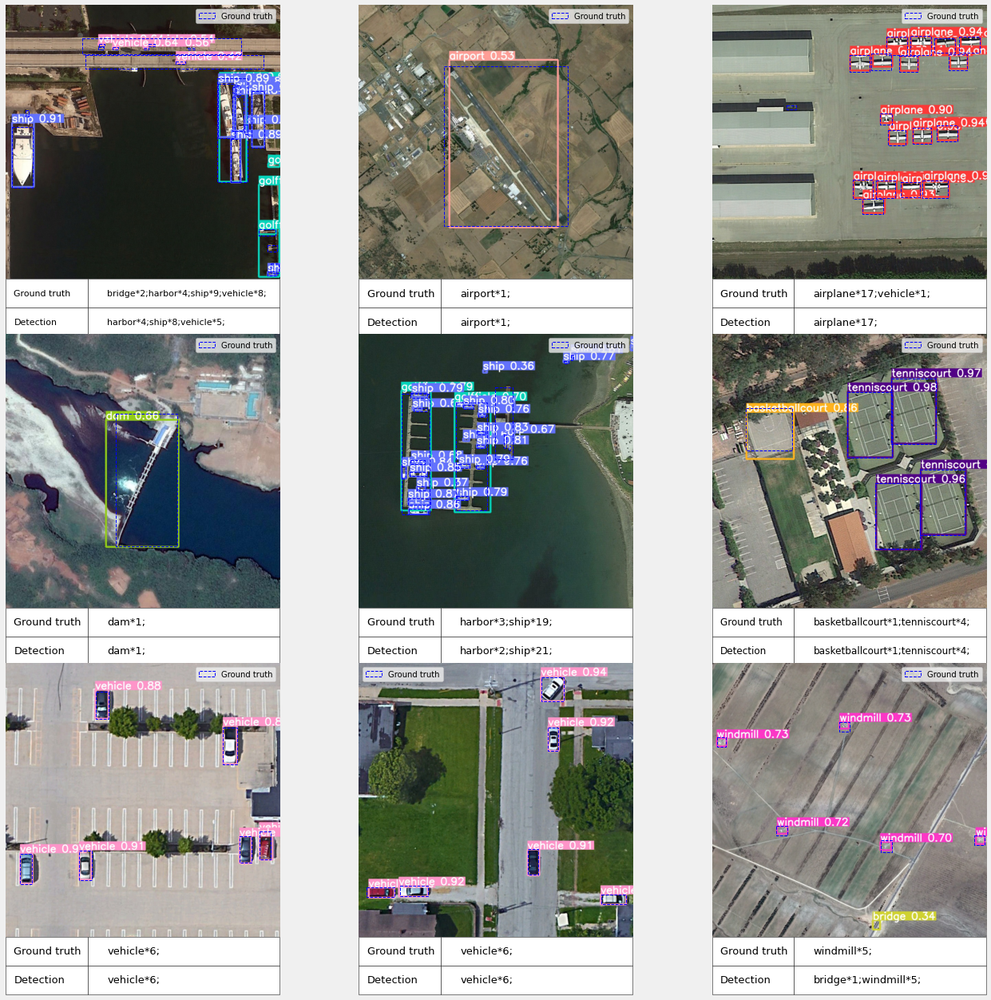

In [ ]:
#display inference on ALL test images
#this looks much better with longer training above

from IPython.display import Image, display

detectedimage_files = glob('/content/yolov5/runs/detect/exp5/*.jpg')
detectedimage_files = natsorted(detectedimage_files, key=lambda y: y.lower())
basenumber_GT = [os.path.basename(x).split('.')[0] for x in detectedimage_files]
groudtruth_file = glob('/content/datasets/DIOR/test/labels/*.txt')
groudtruth_file = natsorted(groudtruth_file, key=lambda y: y.lower())
detected_box_files = glob('/content/yolov5/runs/detect/exp5/labels/*.txt')
detected_box_files = natsorted(detected_box_files, key=lambda y: y.lower())
basenumber_DB = [os.path.basename(x).split('.')[0] for x in detected_box_files]

class_name_to_id_mapping = {'airplane':0,
                'airport':1, 
                'baseballfield':2, 
                'basketballcourt':3, 
                'bridge':4,
                'chimney':5,
                'dam':6,
                'Expressway-Service-area':7,
                'Expressway-toll-station':8,
                'harbor':9,
                'golffield':10,
                'groundtrackfield':11,
                'overpass':12,
                'ship':13,
                'stadium':14,
                'storagetank':15,
                'tenniscourt':16,
                'trainstation':17,
                'vehicle':18,
                'windmill':19}

plt.figure(figsize=(20, 20))
rng = rng = np.random.default_rng(seed=6)
num_image_for_plot = 9
# label = class_name
selected_images = rng.integers(len(detectedimage_files), size=num_image_for_plot)

for i,idx in enumerate(selected_images):
  ax = plt.subplot(3, 3, i+1)
  image_path = detectedimage_files[idx]
  x_sample = tf.keras.utils.load_img(image_path)
  x_sample = tf.keras.utils.img_to_array(x_sample).astype("uint8")
  ax.imshow(x_sample)

  groundtruth = pd.read_csv(groudtruth_file[idx], sep=" ", header=None)
  groundtruth.columns = ['class','x_center','y_center','w','h']
  bbox_cols = ['x_center','y_center','w','h']
  groundtruth['BBox']=[x for x in groundtruth[bbox_cols].to_numpy().astype(float)]
  groundtruth = groundtruth.drop(bbox_cols, axis=1)

  if basenumber_GT[idx] in basenumber_DB:
    DB_index = basenumber_DB.index(basenumber_GT[idx])
    detected_box = pd.read_csv(detected_box_files[DB_index], sep=" ", header=None)
    detected_box.columns = ['class','x_center','y_center','w','h']
    detected_box['BBox']=[x for x in detected_box[bbox_cols].to_numpy().astype(float)]
    detected_box = detected_box.drop(bbox_cols, axis=1)  
  else:
    detected_box = pd.DataFrame()
    detected_box['class'] = None
    detected_box['BBox'] = None


  for j in range(np.shape(groundtruth['BBox'])[0]):
    x_center, y_center, w, h=groundtruth['BBox'][j]
    height,width = x_sample.shape[:2] 
    startX = (2*x_center*width-w*width)/2
    startY = (2*y_center*height-h*height)/2
    endX = startX + w*width
    endY = startY + h*height
    rect = patches.Rectangle((startX, startY), endX-startX, endY-startY, linewidth=1,ls='--', edgecolor='b', facecolor='none')
    ax.add_patch(rect)
    classes, counts = np.unique(groundtruth['class'], return_counts=True)
    GT = ""
    for cl,co in zip(classes,counts):
      class_name = list(class_name_to_id_mapping.keys())[list(class_name_to_id_mapping.values()).index(cl)]
      GT = GT + str(class_name) + "*" + str(co) +";" 
    classes, counts = np.unique(detected_box['class'], return_counts=True)
    DB = ""
    for cl,co in zip(classes,counts):
      class_name = list(class_name_to_id_mapping.keys())[list(class_name_to_id_mapping.values()).index(cl)]
      DB = DB + str(class_name) + "*" + str(co) +";" 
    ax.axis('off')


  ax.legend([rect], ["Ground truth"],fontsize=10) 
  if DB.strip() == '':
    DB = 'None'
  table = plt.table(cellText=[["Ground truth",GT.strip()],["Detection",DB.strip()]],loc='bottom',cellLoc='left',colWidths = [0.3,0.7])
  table.scale(1,3)
  ax.axis('off')
  

plt.show()